# Pokemon Classification

In [1]:
%pip install -q imageio pydot tensorflow-gpu==2.9.1 keras matplotlib graphviz moviepy


Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import keras_tuner as kt
from numpy import asarray
from IPython.display import Image
import numpy as np
import matplotlib.pyplot as plt
import pathlib
import os.path
import imageio.v2 as imageio
import glob
from skimage.color import lab2rgb
from sklearn.manifold import TSNE
from sklearn.neighbors import KNeighborsClassifier
# os.environ["CUDA_VISIBLE_DEVICES"]="-1"


/media/programming/projects/machineLearning/ML/venv/lib/python3.8/site-packages/requests/__init__.py:109: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn(


## Import all Modules and Configure GPU

In [3]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import mixed_precision
import tensorflow_io as tfio

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        # Enable float16 bit for improved performance.
        mixed_precision.set_global_policy('mixed_float16')
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3070 Ti, compute capability 8.6


2022-08-10 11:44:03.412871: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 11:44:03.435214: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 11:44:03.435384: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 11:44:03.436061: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero


In [4]:
print("TensorFlow version:", tf.__version__)


TensorFlow version: 2.9.1


## Load DataSet

In [5]:
def load_from_directory(data_dir, image_size, batch_size, train_size=0.8):
    def configure_for_performance(ds, AUTOTUNE, shuffleSize):
        #ds = ds.cache(filename='/tmp/pokemonCache', name='pokemonCache')
        #ds = ds.cache()
        if shuffleSize > 0:
            ds = ds.shuffle(buffer_size=shuffleSize, reshuffle_each_iteration=False)
        ds = ds.prefetch(buffer_size=AUTOTUNE)

        return ds

    data_train_dir = pathlib.Path(data_dir)
    train_ds = tf.keras.utils.image_dataset_from_directory(
        data_train_dir,
        interpolation='bilinear',
        color_mode='rgb',
        label_mode='int',
        follow_links=True,
        shuffle=True,
        image_size=image_size,
        batch_size=batch_size)
    #
    AUTOTUNE = tf.data.AUTOTUNE
    normalization_layer = tf.keras.layers.Rescaling(1.0 / 255.0)

    class_names = train_ds.class_names

    @tf.function
    def preprocess_lab2(img):
        image = tf.cast(img, tf.float16)
        lab = tfio.experimental.color.rgb_to_lab(image)

        return lab

    nrBatches = len(train_ds)

    # Translate [0,255] -> [-1, 1]
    normalized_train_ds = (train_ds.map(lambda x, y: (preprocess_lab2(normalization_layer(x)) * (1.0 / 128.0), y)))

    final_normalized_train_ds = normalized_train_ds.take(int(train_size * nrBatches))

    offset_skip = int(train_size * nrBatches)
    validation_nr_batchs = int((1.0 - train_size) * nrBatches)
    normalized_test_ds = normalized_train_ds.skip(offset_skip).take(validation_nr_batchs)

    return configure_for_performance(final_normalized_train_ds, AUTOTUNE, 0), configure_for_performance(normalized_test_ds, AUTOTUNE, 0), class_names


In [6]:
BATCH_SIZE = 8
IMAGE_SIZE = (128, 128)
EPOCHS = 12

data_directory_path = "PokemonData/"
data_dir = pathlib.Path(data_directory_path)

train_images, validation_images, classes = load_from_directory(data_dir, IMAGE_SIZE, BATCH_SIZE, 0.9)

print("Train: Number of batches {0} of {1} elements".format(
    len(train_images), BATCH_SIZE))

print("Validation: Number of batches {0} of {1} elements".format(
    len(train_images), BATCH_SIZE))


Found 6820 files belonging to 150 classes.
Train: Number of batches 767 of 8 elements
Validation: Number of batches 767 of 8 elements


2022-08-10 11:44:03.741985: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-08-10 11:44:03.742866: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 11:44:03.743029: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-08-10 11:44:03.743144: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zer

## Augment DataSet
By augmenting the image, it can reduce overfitting since no image will be the same between each epoch.

In [7]:
trainAug = tf.keras.Sequential([
    layers.RandomFlip("horizontal_and_vertical"),
    layers.RandomZoom(
        height_factor=(-0.05, -0.15),
        width_factor=(-0.05, -0.15)),
    layers.RandomRotation(0.3)
])

def augmentFunc(x, y):
    aX = trainAug(x)
    return (aX, aX)

def augmentClass(x, y):
    aX = trainAug(x)
    return (aX, y)

# None Augmented Version
trainAugmentedClassificationDS = (
    train_images
    .map(augmentClass,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)
validateAugmentedClassificationDS = (
    validation_images
    .map(augmentClass,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)

# Augmented Version
trainAugmentedAEDS = (
    train_images
    .map(augmentFunc,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)
validateAugmentedAEDS = (
    validation_images
    .map(augmentFunc,
         num_parallel_calls=tf.data.AUTOTUNE)
    .prefetch(tf.data.AUTOTUNE)
)


# Example Data

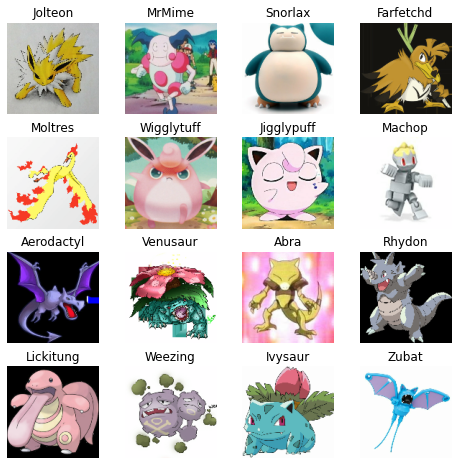

In [8]:
bathc_iter = iter(train_images)
image_batch, expected_batch = next(bathc_iter)


nrCol = 16
plt.figure(figsize=(4 * 2, 4 * 2))
for i in range(0, nrCol):

    trainImage, expected = (image_batch[i % len(image_batch)], expected_batch[i % len(expected_batch)])  # (images + 1.0) / 2.0
    trainImage = lab2rgb(trainImage * 128.0)

    ax = plt.subplot(4, 4, i + 1)
    plt.title(label=str.format("{0}", classes[expected]))
    plt.imshow(asarray(trainImage).astype(dtype='float32'))
    plt.axis("off")

    if (i + 1) % len(image_batch) == 0:
        image_batch, expected_batch = next(bathc_iter)
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()


## Augmented

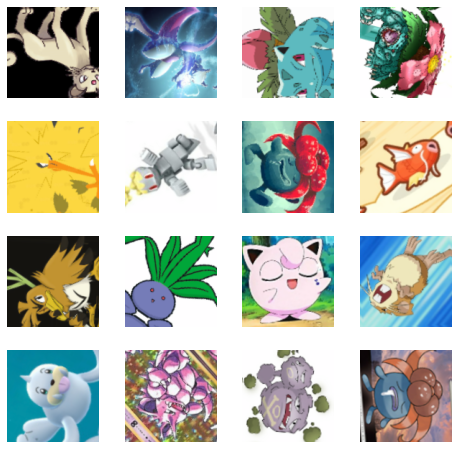

In [9]:
bathc_iter = iter(trainAugmentedAEDS)
image_batch, expected_batch = next(bathc_iter)


nrCol = 16
plt.figure(figsize=(4 * 2, 4 * 2))
for i in range(0, nrCol):

    trainImage, expected = (image_batch[i % len(image_batch)], expected_batch[i % len(expected_batch)])  # (images + 1.0) / 2.0
    trainImage = lab2rgb(trainImage * 128.0)

    ax = plt.subplot(4, 4, i + 1)

    plt.imshow(asarray(trainImage).astype(dtype='float32'))
    plt.axis("off")

    if (i + 1) % len(image_batch) == 0:
        image_batch, expected_batch = next(bathc_iter)
plt.subplots_adjust(wspace=0.25, hspace=0.25)
plt.show()


## Create Image Classification

In [10]:

def generate_cnn_builder(hp, input, output):
    activation_dict = {
        'leaky_relu': layers.LeakyReLU(alpha=0.2, dtype='float32'),
        'relu': layers.ReLU(dtype='float32')
    }

    kernel_activation = hp.Choice('kernel_activation', ['relu', 'leaky_relu'])

    #
    kernel_init = hp.Choice('kernel_initializer', ['uniform', 'lecun_uniform', 'normal', 'zero',
                                                   'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform'])

    batch_norm = hp.Boolean('batch_norm')

    max_pooling = hp.Boolean('max_pooling')
    hp_kernel_filter_size_l1 = hp.Int('kernel_filter', min_value=4, max_value=6, step=1)
    kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=1)

    number_layers = hp.Int(
        'number_layers', min_value=3, max_value=4, step=1)

    model = tf.keras.Sequential()

    max_filters_size = 1024

    for i in range(0, number_layers):
        filter_size = (2 ** (hp_kernel_filter_size_l1 + i))
        filter_size = min(max_filters_size, filter_size)

        model.add(
            layers.Conv2D(filters=filter_size, kernel_size=kernel_size, strides=(1, 1), kernel_initializer=kernel_init))
        model.add(activation_dict[kernel_activation])
        if batch_norm:
            model.add(layers.BatchNormalization(dtype='float32'))

        if max_pooling:
            model.add(layers.MaxPooling2D(pool_size=(2, 2)))
        else:
            model.add(
                layers.Conv2D(filters=filter_size, kernel_size=kernel_size, kernel_initializer=kernel_init, strides=(2, 2)))
            model.add(activation_dict[kernel_activation])
            if batch_norm:
                model.add(layers.BatchNormalization(dtype='float32'))

    model.add(layers.Flatten())

    hp_units = hp.Int('dense0_units', min_value=160, max_value=512, step=32)
    model.add(layers.Dense(units=hp_units, kernel_initializer=kernel_init))
    model.add(activation_dict[kernel_activation])
    if batch_norm:
        model.add(layers.BatchNormalization(dtype='float32'))

    model.add(layers.Dense(output))

    hp_optimizer = hp.Choice('optimizer', ['adam', 'sgd', 'rmsprop'])

    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4])

    optimizer = tf.keras.optimizers.get(hp_optimizer)
    optimizer.learning_rate = hp_learning_rate

    model.compile(optimizer=optimizer,
                  loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                  metrics=['accuracy'])

    return model


## 

In [17]:
# Neuron network input and output.
num_classes_output = len(classes)


def model_builder(hp):
    model = generate_cnn_builder(hp, (IMAGE_SIZE[0], IMAGE_SIZE[1], 3), num_classes_output)
    return model


tuner = kt.Hyperband(model_builder,
                     objective='val_accuracy',
                     max_epochs=16,
                     factor=3,
                     directory='cache',
                     project_name='Pokemon_Image_Classification')

stop_early = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', patience=5)

tuner.search(trainAugmentedClassificationDS, epochs=EPOCHS, batch_size=BATCH_SIZE,
             validation_data=validateAugmentedClassificationDS,
             callbacks=[stop_early, tf.keras.callbacks.TerminateOnNaN()], verbose=1)

best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

pokemon_classification_model = tuner.hypermodel.build(best_hps)
#pokemon_classification_model.summary()


INFO:tensorflow:Reloading Oracle from existing project cache/Pokemon_Image_Classification/oracle.json
INFO:tensorflow:Reloading Tuner from cache/Pokemon_Image_Classification/tuner0.json
INFO:tensorflow:Oracle triggered exit


In [ ]:
EPOCHS = 192

checkpoint_path = "checkpoints/pokemon_classification.ckpt"

# Create a callback that saves the model's weights
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=0)

checkpoint = tf.train.Checkpoint(model=pokemon_classification_model)
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_path)).expect_partial()


# The model weights (that are considered the best) are loaded into the model.
if os.path.exists(checkpoint_path):
    pokemon_classification_model.load_weights(checkpoint_path)


pokemon_classification_result = pokemon_classification_model.fit(trainAugmentedClassificationDS, epochs=EPOCHS, batch_size=BATCH_SIZE, validation_data=validateAugmentedClassificationDS,
                                                                 callbacks=[cp_callback])

pokemon_classification_model.save_weights(checkpoint_path)

#
pokemon_classification_model.save("pokemon-classification.h5")


In [19]:
pokemon_classification_model = tf.keras.models.load_model("pokemon-classification.h5")


# Classiciation Result

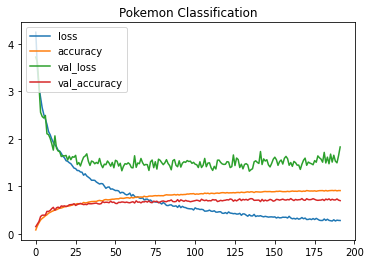

<Figure size 432x288 with 0 Axes>

In [20]:
def plotCostHistory(history, loss_label="", val_label="", title="", x_label="", y_label=""):
    plt.figure()
    for k, v in history.items():
        plt.plot(v, label=k)
    plt.title(label=title)
    plt.ylabel(ylabel=y_label)
    plt.xlabel(xlabel=x_label)
    plt.legend(loc="upper left")
    plt.show()
    plt.savefig(title + ".png")


plotCostHistory(pokemon_classification_result.history, title='Pokemon Classification')


## Create AutoEncoder

In [21]:
def model_constructor(hp, latent_space, image_size):

    class Autoencoder(keras.Model):
        def __init__(self, hp, **kwargs):
            super(Autoencoder, self).__init__(**kwargs)

            activation_dict = {
                'leaky_relu': layers.LeakyReLU(alpha=0.2, dtype='float32'),
                'relu': layers.ReLU(dtype='float32')
            }

            batch_norm = hp.Boolean('batch_norm')
            use_upscale = hp.Boolean('Upscale')

            kernel_init = hp.Choice('kernel_initializer', ['uniform', 'lecun_uniform', 'normal', 'zero',
                                                           'glorot_normal', 'glorot_uniform', 'he_normal', 'he_uniform'])
            kernel_activation = hp.Choice('kernel_activation', ['relu', 'leaky_relu'])

            hp_kernel_filter_size_l1 = hp.Int('kernel_filter', min_value=7, max_value=9, step=1)
            hp_kernel_size = hp.Int('kernel_size', min_value=3, max_value=5, step=1)
            num_downscale = hp.Int('num_downscale', min_value=1, max_value=2, step=1)

            number_layers = hp.Int(
                'number_layers', min_value=2, max_value=3, step=1)

            regularization = hp.Int(
                'regularization', min_value=4, max_value=5, step=1)

            self.encoder = tf.keras.Sequential(name="Encoder")
            self.encoder.add(layers.Input(image_size))

            encoder_last_conv2 = None

            for i in range(0, number_layers):
                filter_size = 2 ** (hp_kernel_filter_size_l1 - i)

                for j in range(0, num_downscale):
                    self.encoder.add(layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                                   padding='same', strides=(2, 2), kernel_initializer=kernel_init))
                    if batch_norm:
                        self.encoder.add(layers.BatchNormalization(dtype='float32'))
                    self.encoder.add(activation_dict[kernel_activation])

                #
                encoder_last_conv2 = layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                                   strides=(1, 1), padding='same', kernel_initializer=kernel_init)
                self.encoder.add(encoder_last_conv2)
                if batch_norm:
                    self.encoder.add(layers.BatchNormalization(dtype='float32'))
                self.encoder.add(activation_dict[kernel_activation])

            connect_conv_shape = encoder_last_conv2.output_shape

            # Flatten to connect to forward neuron.
            self.encoder.add(layers.Flatten())

            # For adding sparse, for improve of thing with small variance.
            self.encoder.add(layers.Dense(units=latent_space, activation=None, bias_initializer=None, kernel_initializer=None,
                             activity_regularizer=keras.regularizers.L1(10 ** -regularization), dtype='float32', name="latentspace"))

            # Create decoder.
            self.decoder = tf.keras.Sequential(name="Decoder")

            self.decoder.add(layers.Dense(units=(connect_conv_shape[1] * connect_conv_shape[2] * connect_conv_shape[3]),
                             activation=None, bias_initializer=None, kernel_initializer=None, dtype='float32'))

            self.decoder.add(layers.Reshape(target_shape=(
                connect_conv_shape[1], connect_conv_shape[2], connect_conv_shape[3])))

            for i in range(0, number_layers):
                filter_size = 2 ** ((hp_kernel_filter_size_l1 - number_layers) + i + 1)

                self.decoder.add(layers.Conv2D(filters=filter_size, kernel_size=hp_kernel_size,
                                 strides=(1, 1), padding='same', kernel_initializer=kernel_init))
                if batch_norm:
                    self.decoder.add(layers.BatchNormalization(dtype='float32'))
                self.decoder.add(activation_dict[kernel_activation])

                for j in range(0, num_downscale):
                    if use_upscale:
                        self.decoder.add(layers.UpSampling2D(size=(2, 2)))
                    else:
                        self.decoder.add(layers.Conv2DTranspose(filters=filter_size, kernel_size=hp_kernel_size,
                                                                padding='same', strides=(2, 2), kernel_initializer=kernel_init))
                        if batch_norm:
                            self.decoder.add(layers.BatchNormalization(dtype='float32'))
                        self.decoder.add(activation_dict[kernel_activation])

            self.decoder.add(layers.Conv2D(filters=3, kernel_size=(3, 3), padding='same', kernel_initializer=kernel_init))
            if batch_norm:
                self.decoder.add(layers.BatchNormalization(dtype='float32'))
            self.decoder.add(layers.Activation(activation='tanh', dtype='float32'))

        def call(self, x):
            encoded = self.encoder(x)
            decoded = self.decoder(encoded)
            return decoded

        def getEncoder(self):
            return self.encoder

        def getDecoder(self):
            return self.decoder

        def getModel(self):
            ae_input = layers.Input(shape=image_size, name="AE_input")
            ae_encoder_output = self.getEncoder()(ae_input)
            ae_decoder_output = self.getDecoder()(ae_encoder_output)

            return keras.Model(inputs=ae_input, outputs=ae_decoder_output)

        def compile(self, **kwargs):
            super(Autoencoder, self).compile(**kwargs)

        def summary(self, **kwargs):
            super(Autoencoder, self).summary(**kwargs)
            self.encoder.summary()

    autoencoder = Autoencoder(hp)
    hp_optimizer = hp.Choice('optimizer', ['sgd', 'adam', 'rmsprop'])
    hp_learning_rate = hp.Choice('learning_rate', values=[2e-2, 2e-3, 2e-4])

    hp_loss = hp.Choice('loss', ['mse', 'binary_crossentropy'])

    optimizer = tf.keras.optimizers.get(hp_optimizer)
    optimizer.learning_rate = hp_learning_rate

    model = autoencoder.getModel()
    model.compile(optimizer=optimizer, loss=hp_loss, metrics=['accuracy'])
    model.summary()
    model.layers[1].summary()
    model.layers[2].summary()

    return model


## Hyperparameter
Find the best model out of all the parameters.

In [22]:

latent_spaces = [2, 4, 8, 16, 32, 64, 128, 256]
ae_models = []

for latent_space in latent_spaces:

    def hyperparamter_model_builder(hp):
        model = model_constructor(hp, latent_space, (IMAGE_SIZE[0], IMAGE_SIZE[1], 3))
        return model

    tuner = kt.Hyperband(hyperparamter_model_builder,
                         objective='val_accuracy',
                         max_epochs=16,
                         factor=4,
                         directory='cache',
                         project_name=str.format('Pokemon L{0} - {1}', latent_space, "Dimension Reduction"))

    stop_early = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss', patience=3)

    tuner.search(trainAugmentedAEDS, epochs=EPOCHS, shuffle=True, batch_size=BATCH_SIZE,
                 callbacks=[stop_early, tf.keras.callbacks.TerminateOnNaN()], validation_data=validateAugmentedAEDS, verbose=1)

    best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

    autoencoder_model = tuner.hypermodel.build(best_hps)

    ae_models.append(autoencoder_model)


Trial 32 Complete [00h 00m 21s]
val_accuracy: 0.9319594502449036

Best val_accuracy So Far: 0.933062732219696
Total elapsed time: 00h 39m 44s
INFO:tensorflow:Oracle triggered exit


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 AE_input (InputLayer)       [(None, 128, 128, 3)]     0         
                                                                 
 Encoder (Sequential)        (None, 256)               5261184   
                                                                 
 Decoder (Sequential)        (None, 128, 128, 3)       5525903   
                                                                 
Total params: 10,787,087
Trainable params: 10,782,473
Non-trainable params: 4,614
_________________________________________________________________
Model: "Encoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_7 (Conv2D)           (None, 64, 64, 256)       12544     
                                                                 
 batch_normalization_7 (Ba

In [23]:
def showResult(model, batchImage, maxNumImages=6):
    output = model.predict(batchImage)
    
    nrElements = min(len(output), maxNumImages)

    batch_iter = iter(batchImage)
    image_batch, _ = next(batch_iter)

    fig = plt.figure(figsize=(maxNumImages * 2, 2 * 2))
    for i in range(nrElements):

        ax = plt.subplot(2, maxNumImages, i + 1)
        plt.imshow((asarray(lab2rgb(image_batch[i % len(image_batch)] * 128)).astype(dtype='float32')))
        plt.axis("off")

        ax = plt.subplot(2, maxNumImages, maxNumImages + i + 1)
        plt.imshow((asarray(lab2rgb(output[i] * 128)).astype(dtype='float32')))
        plt.axis("off")

        if (i + 1) % len(image_batch) == 0:
            image_batch, _ = next(batch_iter)

    fig.subplots_adjust(wspace=0.05, hspace=0.05)
    plt.close()
    return fig


class save_images(tf.keras.callbacks.Callback):

    def __init__(self, dir_path, latent_space, trainData, **kwargs):
        super(tf.keras.callbacks.Callback, self).__init__(**kwargs)
        self.trainSet = trainData.take(12)
        self.latent_space = latent_space
        self.dir_path = dir_path
        if not os.path.exists(self.dir_path):
            os.mkdir(self.dir_path)

    def on_epoch_end(self, epoch, logs=None):
        fig = showResult(self.model, self.trainSet)
        fig.savefig("{0}/PokemonL{1}_{2}.png".format(self.dir_path, self.latent_space, epoch))
        fig = showResult(self.model, self.trainSet, 12)
        fig.savefig("{0}/PokemonBigL{1}_{2}.png".format(self.dir_path, self.latent_space, epoch))


In [ ]:
model_results = []
EPOCHS = 48

for latent_space, ae_model in zip(latent_spaces, ae_models):

    # Construct the checkpoint path for specific latent space size.
    checkpoint_path = str.format("checkpoints/Pokemon_L{}_Reconstruction/cp.ckpt", latent_space)

    # Create a callback that saves the model's weights
    cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                     save_weights_only=True,
                                                     verbose=0)

    checkpoint = tf.train.Checkpoint(model=ae_model)
    checkpoint.restore(tf.train.latest_checkpoint(checkpoint_path)).expect_partial()

    # The model weights (that are considered the best) are loaded into the model.
    if os.path.exists(checkpoint_path):
        ae_model.load_weights(checkpoint_path)

    model_history = ae_model.fit(trainAugmentedAEDS,
                                 epochs=EPOCHS,
                                 batch_size=BATCH_SIZE,
                                 shuffle=True,
                                 validation_data=validateAugmentedAEDS,
                                 verbose=2, callbacks=[cp_callback, save_images(str.format("Pokemon_L{0}", latent_space), latent_space, trainAugmentedAEDS)])
    # Save the results.
    model_results.append(model_history)

    # Save weights.
    ae_model.save_weights(checkpoint_path)

    del ae_model


In [ ]:
for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):
    model.save(str.format("Pokemon_L{0}.h5", latent_space))

## Evolution Performance

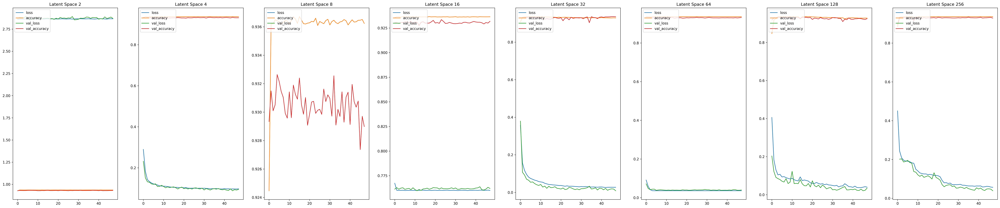

<Figure size 432x288 with 0 Axes>

In [25]:
def plotCostHistories(results, loss_label="", val_label="", title="", x_label="", y_label=""):
    fig = plt.figure(figsize=(len(results) * 6.25, 10), dpi=300)
    for i, (latent_space, result) in enumerate(zip(latent_spaces, results)):
        ax = plt.subplot(1, len(results), i + 1)
        for k, v in result.history.items():
            plt.plot(v, label=k)
        ax.title.set_text(str.format('Latent Space {0}', latent_space))

        plt.ylabel(ylabel=y_label)
        plt.xlabel(xlabel=x_label)
        plt.legend(loc="upper left")latent_value

## Compare Result
The following compares the original and resulted reconstructed results in respect to each lantent spaces.

In [31]:
# Plot Result
predictData = trainAugmentedAEDS.take(20)

bathc_iter = iter(train_images)
image_batch, expected_batch = next(bathc_iter)

fig = plt.figure(figsize=(len(ae_models) * 3 * 4, 3*4), dpi=300)
main_outer = fig.add_gridspec(1, len(ae_models), wspace=0.05, hspace=0.05)

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

    result = model.predict(predictData, batch_size=256, verbose=0) * 128
    #encoder_model = model.layers[1]

    outer = main_outer[i].subgridspec(3, 3, wspace=0.02, hspace=0.02)

    for a in range(3):
        for b in range(3):
            inner = outer[a, b].subgridspec(1, 2, wspace=0, hspace=0)

            axs = inner.subplots()  # Create all subplots for the inner grid.
            for (d,), ax in np.ndenumerate(axs):
                ax.grid(False)
                ax.axis("off")
                if d == 0:
                    ax.imshow(asarray(lab2rgb(image_batch[(b * 2 + a) % len(image_batch)] * 128)).astype(dtype='float32'))
                    ax.set_title('Train Data')
                else:
                    ax.imshow(asarray(lab2rgb(result[b * 2 + a])).astype(dtype='float32'))
                    ax.set_title('Reconstructed')

                # Fetch the next batch of image data.
                if (b * 2 + a + 1) % len(image_batch) == 0:
                    image_batch, expected_batch = next(bathc_iter)

for ax in fig.get_axes():
    ss = ax.get_subplotspec()
    ax.spines.top.set_visible(ss.is_first_row())
    ax.spines.bottom.set_visible(ss.is_last_row())
    ax.spines.left.set_visible(ss.is_first_col())
    ax.spines.right.set_visible(ss.is_last_col())
plt.show(block=False)


2022-08-11 07:00:32.222150: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
/home/voldie/.local/lib/python3.8/site-packages/skimage/_shared/utils.py:394: UserWarning: Color data out of range: Z < 0 in 16384 pixels
  return func(*args, **kwargs)
2022-08-11 07:00:36.088436: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:00:40.985080: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile


## Plot Dimensional Reduction
It is possible to plot both 1 and 2 latent space dim. However, as dimension increased, it becomes impractial to plot them all toghter. Indiviually it is possible.

2022-08-11 07:24:14.705191: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:15.784879: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:16.650831: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:16.901090: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:18.573151: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:20.839673: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:21.316214: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:22.277363: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:24:22.581943: W tensorflow/core/lib/png/png_io.cc:88] PNG 

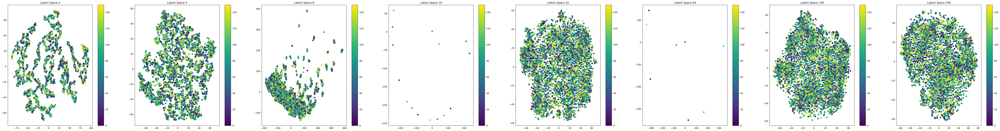

In [44]:
# Plot Result

fig = plt.figure(figsize=(len(ae_models) * 10, 2 * 5), dpi=300)
for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):
    ax = plt.subplot(1, len(ae_models), i + 1)

    encoder_model = model.layers[1]
    latent_value = encoder_model.predict(train_images, batch_size=96, verbose=0)

    train_labels = np.array(list(map(lambda x: x[1], train_images))).flatten()

    if len(latent_value[0]) > 1:
        tsne = TSNE(n_components=2, init='pca', random_state=0, learning_rate='auto')
        latent_value = np.array(list(map(lambda x: x, latent_value)))
        X_tsne = tsne.fit_transform(latent_value)
        #X_tsne = list(map(lambda x: x, X_tsne))

        ax.title.set_text(str.format('Latent Space {0}', lantent_space))
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=train_labels)
        plt.colorbar()
    else:
        plt.scatter(latent_value[:, 0], np.zeros(len(latent_value)), c=train_labels)
        plt.colorbar()
plt.show(block=False)


## Latent Space Classification
If the data can be can be clustered with the latent space. That means that it should be possible perform image classification with the latent space.

In [51]:
def plot_value_array(ax, i, predictions_array, true_label, nr_classes=10):
    true_label = true_label[i]
    ax.grid(False)
    ax.set(ylim=[0, 1])
    thisplot = ax.bar(range(nr_classes), predictions_array, color="#777777")
    predicted_label = np.argmax(predictions_array)

    thisplot[predicted_label].set_color('red')
    thisplot[true_label].set_color('blue')


In [52]:
# Plot Classification Prediction Result
accu_evolutions = []

fig = plt.figure(figsize=(len(ae_models) * 10, 2 * 5), dpi=300)
outer = fig.add_gridspec(1, len(ae_models), wspace=0.05, hspace=0.2, left=0.03, right=0.98, bottom=0.03, top=0.98)
trainY = np.array(list(map(lambda x: x[1], train_images))).flatten()

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

    # Compute latent space.
    encoder_model = model.layers[1]
    latent_value = encoder_model.predict(trainAugmentedClassificationDS, batch_size=256, verbose=0)

    #
    neigh = KNeighborsClassifier(n_neighbors=7)
    neigh.fit(latent_value, trainY)
    prob = neigh.predict_proba(latent_value)

    # Compute accuracy
    result_classification = [np.argmax(_prob) for _prob in prob]
    correct_class = trainY == result_classification
    accu = correct_class.sum() / len(latent_value)
    accu_evolutions.append(accu)

    inner = outer[i].subgridspec(3, 3, wspace=0.02, hspace=0.02)

    ax = plt.Subplot(fig, outer[i])
    ax.set_title(str.format('Latent Space {0} - Probability {1}', lantent_space, accu))
    ax.axis('off')

    axs = inner.subplots()  # Create all subplots for the inner grid.
    for (c, d), ax in np.ndenumerate(axs):
        index = c * 3 + d
        plot_value_array(ax, index, prob[index], trainY, len(classes))


plt.show(block=False)


2022-08-11 07:33:14.120973: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:14.431578: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:14.744607: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:14.858869: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:15.369386: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:16.032092: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:16.200531: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:17.233578: W tensorflow/core/lib/png/png_io.cc:88] PNG warning: iCCP: known incorrect sRGB profile
2022-08-11 07:33:18.240580: W tensorflow/core/lib/png/png_io.cc:88] PNG 

In [53]:
for i, (lantent_space, accu) in enumerate(zip(latent_spaces, accu_evolutions)):
    print(str.format("Latent Space {0} - Accuracy {1}", lantent_space, accu))


Latent Space 2 - Accuracy 0.1628096479791395
Latent Space 4 - Accuracy 0.1641134289439374
Latent Space 8 - Accuracy 0.1628096479791395
Latent Space 16 - Accuracy 0.005052151238591917
Latent Space 32 - Accuracy 0.15938722294654498
Latent Space 64 - Accuracy 0.005052151238591917
Latent Space 128 - Accuracy 0.1644393741851369
Latent Space 256 - Accuracy 0.1598761408083442


## Transition Latent Space
This show if the latent space between two points are continuous.

In [54]:
import scipy
import moviepy.editor


In [55]:
def interpolate(zs, steps):
    out = []
    for i in range(len(zs)-1):
        for index in range(steps):
            fraction = index/float(steps)
            out.append(zs[i+1]*fraction + zs[i]*(1-fraction))
    return out


In [56]:
def generate_grid_image(model, latent_space, figsize=(8, 8), subplotsize=(3, 3)):
    # Notice `training` is set to False.
    # This is so all layers run in inference mode (batchnorm).
    predictions = model(latent_space, training=False)

    fig = plt.figure(figsize=figsize)
    for i in range(predictions.shape[0]):
        plt.subplot(subplotsize[0], subplotsize[1], i + 1)
        rgb = (predictions[i, :, :, 0:3] + 1.0) / 2.0
        plt.imshow(np.asarray(rgb))
        plt.axis('off')
    plt.close()
    return fig


In [60]:

fps = 15
duration_sec = 5
smoothing_sec = 1.0
num_frames = 4 * fps

for i, (lantent_space, model) in enumerate(zip(latent_spaces, ae_models)):

    encoder_model = model.layers[1]
    latent_value0 = encoder_model.predict(trainAugmentedAEDS.take(2), batch_size=9, verbose=0)

    latent_value1 = encoder_model.predict(trainAugmentedAEDS.skip(2).take(2), batch_size=9, verbose=0)

    nr_elemenets = 16

    all_latents = interpolate([latent_value0[0:16], latent_value1[0:16]], num_frames)

    def make_frame(t):
        frame_idx = int(np.clip(np.round(t * fps), 0, num_frames - 1))
        latents = all_latents[frame_idx]

        # Generate figure in respect new latent pace
        fig = generate_grid_image(model.layers[2], latents, (5, 5), (4, 4))

        # Convert figure to bitmap.
        fig.canvas.draw()
        data = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))

        return data

    gif_path_dir = "autoencoder_pokemon_reconstruct"
    if not os.path.exists(gif_path_dir):
        os.mkdir(gif_path_dir)
    gif_filepath = ('{0}/latent_transition_grid_I{1}.gif'.format(gif_path_dir, lantent_space))
    video_clip = moviepy.editor.VideoClip(make_frame, duration=duration_sec)
    video_clip.write_gif(gif_filepath, fps=fps)


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I2.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I4.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I8.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I16.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I32.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I64.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I128.gif with imageio.


MoviePy - Building file autoencoder_pokemon_reconstruct/latent_transition_grid_I256.gif with imageio.
